# ECS7020P mini-project submission
basic solution

### 1. Author

Student Name - Shivani Gurung R

Student ID - 210268155

### 2 Problem formulation

In this project, we need to build a machine learning pipeline that will input as a Harry Potter or a Star Wars audio and predicts its song label and displays. 

Classifying audio recordings is a process that can be applied to various AI applications, such as identifying music genres or acting as a virtual assistant.



### 3 Machine Learning pipeline

Various classification models are used to sort audio files into corresponding class labels.

we will be givin the inputs as wav files and then convert them into tables for better understanding by including relevant column name


<br>

 By iterating through the name of the files given in the dataframe, the audio files are imported using the librosa library.

In the preprocessing stage, each audio file's features are extracted based on the inputs.
The data is then separated to training and validation data. 

then we will be classifying the audio files and finally the precision value for both training and validation data are considered to determine the accuracy of the introduced model.

### 4 Transformation stage

The .wav files are imported using pandas library into a dataframe. In the table the column names are as -file_id, participant, interpretation,	number and	song
  The folder name and filenames are then extracted to give the filepath which is then stored to another dataframe along with the file_id for further processing.considering the filepath as the input librosa will load the corresponding audio file and print "This audio signal has 704027 samples"


The features and the file_id are then stored into a dataframe for further processing. 

X is then considered as a numpy array of the features and Y as a numpy array of file_id. X and Y are then split into training and validation data where 80% of the data is considered as training data and 20% as the validation data, which is split in a random order.

### 5 Modelling
primarily we have used Support Vector Machines(svm).
we have aso used GaussianNB, KNeighborsClassifier, DecisionTreeClassifier,RandomForestClassifier,SVC and AdaBoostClassifier to find the better model with higher accuracy score.

SVM is a fairly straightforward algorithm with exciting features.
Data points are classified according to the hyperplane with the largest margin.SVM classifiers are also called discriminative classifiers because of this.The SVM classifies new data points using the optimal hyperplane.


### 6 Methodology
here in this project with the help of audio feature extraction like pitch we will visualize the audio so that we get a better picture of it. then by adding more audio features with the help of audio features we will then finally divide the data and then train them in to the models and then get the accuracy score of each audio feature after training them into the models.


### 7 Dataset

in this project we are using a total of 830 .wav files which includes humming and whistling of songs from both Harry Potter or Star war theme. The number of Potter recordings present is 402 and The number of StarWars recordings present are 424.

In [41]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [42]:
def download_url(url, save_path):
    with urllib.request.urlopen(url) as dl_file:
        with open(save_path, 'wb') as out_file:
            out_file.write(dl_file.read())

            

In [43]:
files=os.listdir("/content/drive/MyDrive/Data/MLEndHW/potter_1")

In [44]:
for file in files:
  print(file)

S190_whistle_2_StarWars.wav
S198_whistle_2_StarWars.wav
S190_hum_2_StarWars.wav
S122_hum_2_StarWars.wav
S122_whistle_2_StarWars.wav
S198_hum_2_StarWars.wav
S100_hum_4_StarWars.wav
S201_hum_3_StarWars.wav
S100_hum_3_StarWars.wav
S201_hum_4_StarWars.wav
S196_hum_4_StarWars.wav
S88_hum_1_StarWars.wav
S88_hum_2_StarWars.wav
S131_whistle_2_StarWars.wav
S131_hum_2_StarWars.wav
S200_whistle_2_StarWars.wav
S200_hum_2_StarWars.wav
S196_hum_3_StarWars.wav
S176_whistle_2_StarWars.wav
S21_hum_3_StarWars.wav
S21_hum_4_StarWars.wav
S216_hum_3_StarWars.wav
S216_hum_4_StarWars.wav
S176_hum_2_StarWars.wav
S84_hum_3_StarWars.wav
S84_hum_4_StarWars.wav
S111_hum_3_StarWars.wav
S187_whistle_2_StarWars.wav
S187_hum_2_StarWars.wav
S63_hum_4_StarWars.wav
S26_hum_4_StarWars.wav
S63_hum_3_StarWars.wav
S26_hum_3_StarWars.wav
S53_hum_3_StarWars.wav
S19_hum_3_StarWars.wav
S111_hum_4_StarWars.wav
S164_hum_1_StarWars.wav
S177_hum_4_StarWars.wav
S70_hum_4_StarWars.wav
S53_hum_4_StarWars.wav
S177_hum_3_StarWars.wav
S7

In [47]:
files = glob.glob('/content/drive/MyDrive/Data/MLEndHW/potter_1*/*.wav')
len(files) 

830

In [48]:
for _ in range(3):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

In [49]:
print('The full path to the first audio file is: ', files[0])
print('\n')
print('The name of the first audio file is: ', files[0].split('/')[-1])
print('    The participand ID is: ', files[0].split('/')[-1].split('_')[0])
print('    The type of interpretation is: ', files[0].split('/')[-1].split('_')[1])
print('    The interpretation number is: ', files[0].split('/')[-1].split('_')[2])
print('    The song is: ', files[0].split('/')[-1].split('_')[3])

The full path to the first audio file is:  /content/drive/MyDrive/Data/MLEndHW/potter_1/S190_whistle_2_StarWars.wav


The name of the first audio file is:  S190_whistle_2_StarWars.wav
    The participand ID is:  S190
    The type of interpretation is:  whistle
    The interpretation number is:  2
    The song is:  StarWars.wav




creating the table



In [50]:
MLENDHW_table = [] 

for file in files:
  file_name = file.split('/')[-1]
  participant_ID = file.split('/')[-1].split('_')[0]
  interpretation_type = file.split('/')[-1].split('_')[1]
  interpretation_number = file.split('/')[-1].split('_')[2]
  song = file.split('/')[-1].split('_')[3].split('.')[0]
  MLENDHW_table.append([file_name,participant_ID,interpretation_type,interpretation_number, song])

MLENDHW_table

[['S190_whistle_2_StarWars.wav', 'S190', 'whistle', '2', 'StarWars'],
 ['S198_whistle_2_StarWars.wav', 'S198', 'whistle', '2', 'StarWars'],
 ['S190_hum_2_StarWars.wav', 'S190', 'hum', '2', 'StarWars'],
 ['S122_hum_2_StarWars.wav', 'S122', 'hum', '2', 'StarWars'],
 ['S122_whistle_2_StarWars.wav', 'S122', 'whistle', '2', 'StarWars'],
 ['S198_hum_2_StarWars.wav', 'S198', 'hum', '2', 'StarWars'],
 ['S100_hum_4_StarWars.wav', 'S100', 'hum', '4', 'StarWars'],
 ['S201_hum_3_StarWars.wav', 'S201', 'hum', '3', 'StarWars'],
 ['S100_hum_3_StarWars.wav', 'S100', 'hum', '3', 'StarWars'],
 ['S201_hum_4_StarWars.wav', 'S201', 'hum', '4', 'StarWars'],
 ['S196_hum_4_StarWars.wav', 'S196', 'hum', '4', 'StarWars'],
 ['S88_hum_1_StarWars.wav', 'S88', 'hum', '1', 'StarWars'],
 ['S88_hum_2_StarWars.wav', 'S88', 'hum', '2', 'StarWars'],
 ['S131_whistle_2_StarWars.wav', 'S131', 'whistle', '2', 'StarWars'],
 ['S131_hum_2_StarWars.wav', 'S131', 'hum', '2', 'StarWars'],
 ['S200_whistle_2_StarWars.wav', 'S200', '

In [51]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','participant','interpretation','number','song']).set_index('file_id') 
MLENDHW_df

,participant,interpretation,number,song
file_id,,,,
S190_whistle_2_StarWars.wav,S190,whistle,2,StarWars
S198_whistle_2_StarWars.wav,S198,whistle,2,StarWars
S190_hum_2_StarWars.wav,S190,hum,2,StarWars
S122_hum_2_StarWars.wav,S122,hum,2,StarWars
S122_whistle_2_StarWars.wav,S122,whistle,2,StarWars
...,...,...,...,...
S106_hum_3_StarWars.wav,S106,hum,3,StarWars
S38_hum_3_Potter.wav,S38,hum,3,Potter
S38_hum_1_Potter.wav,S38,hum,1,Potter


In [52]:
MLENDHW_df['table_song']=y

In [53]:
MLENDHW_df.to_csv("minibasic_sol.csv")

###pitch feature extraction
It is a fundamental frequency of an audio waveform that is used to analyze and synthesize speech.
here below we are ploting the pitch and we can visualize it as a waveform. 

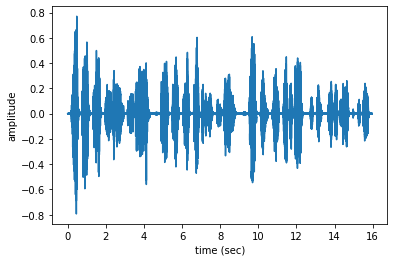

In [54]:
n=0
fs = None # Sampling frequency. If None, fs would be 22050
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

In [55]:
MLENDHW_df.loc[files[n].split('/')[-1]]

participant           S190
interpretation     whistle
number                   2
song              StarWars
table_song           False
Name: S190_whistle_2_StarWars.wav, dtype: object

In [56]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 704027 samples


In this section we will be using four audio features, namely:

Power,
rms,
rms mean,
Pitch mean,
Pitch standard deviation.



In [57]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

In [58]:
#It has rms
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    #print(file_name)
    #print(labels_file.loc[fileID]['interpretation'])
    #print(labels_file.loc[fileID]['interpretation']=='hum')
    #yi = list(labels_file.loc[fileID]['interpretation'])[0]=='hum'
    yi = labels_file.loc[fileID]['song']=='Potter'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    #if scale_audio: x = x/np.max(np.abs(x))

    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x)
    
    rms=librosa.feature.rms(x)
    rms_mean=np.mean(rms)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)
    

    xi = [rms_mean,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

In [59]:
X,y = getXy(files, labels_file=MLENDHW_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 830/830 [49:56<00:00,  3.61s/it]


In [60]:
X_df=pd.DataFrame(X,columns=['rms_mean','pitch_mean','pitch_std','voiced_fr'])
X_df

,rms_mean,pitch_mean,pitch_std,voiced_fr
0,0.062045,386.596488,25.830825,0.401163
1,0.021606,432.361846,19.235395,0.331492
2,0.042084,231.432478,57.359071,0.774689
3,0.059716,186.990618,24.385251,0.755735
4,0.140664,402.219487,28.858715,0.754256
...,...,...,...,...
825,0.124941,219.414627,50.751998,0.879722
826,0.087622,196.622646,41.868453,0.867036
827,0.089365,194.429860,45.490104,0.798629
828,0.137422,365.884451,67.102433,0.900291


In [61]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)

The shape of X is (830, 4)
The shape of y is (830,)
The labels vector is [False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False Fa

In [62]:
print(' The number of Potter recordings is ', np.count_nonzero(y))
print(' The number of StarWars recordings is ', y.size - np.count_nonzero(y))

 The number of Potter recordings is  405
 The number of StarWars recordings is  425


### 8 Results
we will now build a support vector machine (SVM) model for the predictive task of identifying the type of interpretation (hum/whistle) of an audio signal, using the dataset that we have just created.

 we will be using SVM method provided by scikit-learn and we will split the dataset defined by X and y into a training set and a validation set.

In this section we will also train the data into different models and get the accuracy score.

In [63]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((581, 4), (249, 4), (581,), (249,))

In [64]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.5748709122203098
Validation  Accuracy 0.5542168674698795
The support vectors are (544, 4)


In [65]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.774526678141136
Validation  Accuracy 0.6305220883534136
The support vectors are (493, 4)



In the below section we will now train the data into different models and get the accuracy from each model and then compare the accuracy score from the model and find the model with the high accuracy.

In [68]:
mean = X_train.mean(0)

sd =  X_train.std(0)


from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC


X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

classification_models = [
                         GaussianNB(),
                         KNeighborsClassifier(),
                         DecisionTreeClassifier(),
                         RandomForestClassifier(),
                         SVC(kernel='rbf'),
                         AdaBoostClassifier(),
                         
]
scores = []
for model in classification_models:
  model.fit(X_train,y_train)
  score=model.score(X_val,y_val)
  model_name=type(model).__name__
  if model_name=='SVC' and model.kernel=='rbf': model_name='RBF kernel'
  scores.append((model_name,(f'{100*score:.2f}%')))
scores_df = pd.DataFrame(scores,columns=['Classifier','Accuracy Score'])
scores_df.sort_values(by = 'Accuracy Score',axis = 0, ascending = False)

,Classifier,Accuracy Score
5,AdaBoostClassifier,65.06%
1,KNeighborsClassifier,63.45%
3,RandomForestClassifier,58.63%
0,GaussianNB,57.03%
4,RBF kernel,57.03%
2,DecisionTreeClassifier,54.62%


here after comparing the models we can observe that AdaBoost classifier has the highest accuracy than the rest of the models

### 9 Conclusions¶

in conclusions it can be said that after training the data into the svm model we got the accuracy of about 55%
The accuracy we get from the multiple models we constructed are clear and give a better picture of which model has the better accuracy score. hence AdaBoostClassifier has 65.06% of accuracy score and can be told that AdaBoostClassifie works the best for provided data.



